# Image classification using a 3D CNN

This notebook is a use case for 3D CNN. Popular MNIST dataset will be used but with 3D images.

## 1. Loading data

In [1]:
from keras.layers import Conv3D, MaxPool3D, Flatten, Dense
from keras.layers import Dropout, Input, BatchNormalization
from sklearn.metrics import confusion_matrix, accuracy_score
from plotly.offline import iplot, init_notebook_mode
from keras.losses import categorical_crossentropy
from tensorflow.keras.optimizers import Adadelta, Adam
from tensorflow.keras.utils import to_categorical
from keras.models import Sequential, load_model
from keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau, LearningRateScheduler
import plotly.graph_objs as go
from plotly.subplots import make_subplots
from matplotlib.pyplot import cm
import matplotlib.pyplot as plt
from keras.models import Model
import numpy as np
import keras
import h5py

init_notebook_mode(connected=True)
%matplotlib inline
plt.style.use('fivethirtyeight')

In [2]:
with h5py.File('dataset/3d-cnn/full_dataset_vectors.h5', 'r') as dataset:
    print(dataset.keys())
    x_train, x_test = dataset["X_train"][:], dataset["X_test"][:]
    y_train, y_test = dataset["y_train"][:], dataset["y_test"][:]
    
# Data (X) and target (y) for training
print ("X_train shape: ", x_train.shape)
print ("y_train shape: ", y_train.shape)
# Data (X) and target (y) for testing
print ("X_test shape:  ", x_test.shape)
print ("y_test shape:  ", y_test.shape)

<KeysViewHDF5 ['X_test', 'X_train', 'y_test', 'y_train']>
X_train shape:  (10000, 4096)
y_train shape:  (10000,)
X_test shape:   (2000, 4096)
y_test shape:   (2000,)


## 2. Visualization

In [3]:
with h5py.File('dataset/3d-cnn/train_point_clouds.h5', 'r') as points_dataset:        
    digits = []
    for i in range(10):
        digit = (points_dataset[str(i)]["img"][:], 
                 points_dataset[str(i)]["points"][:], 
                 points_dataset[str(i)].attrs["label"]) 
        digits.append(digit)

# First digit
x_0 = [r[0] for r in digits[0][1]]
y_0 = [r[1] for r in digits[0][1]]
z_0 = [r[2] for r in digits[0][1]]
# Fourth digit
x_1 = [r[0] for r in digits[-3][1]]
y_1 = [r[1] for r in digits[-3][1]]
z_1 = [r[2] for r in digits[-3][1]]

In [4]:
# Plot for digit "5"
fig = go.Figure(data=[go.Scatter3d(
    x=x_0,
    y=y_0,
    z=z_0,
    mode='markers',
    marker_symbol = "diamond-open",
    marker=dict(
        size=12,
        color=z_0,                # set color to an array/list of desired values
        colorscale='Viridis',   # choose a colorscale
        opacity=0.8
    )
)])
# Setting layout
fig.update_layout(template = "plotly_dark", height=500, width=600, title= "Digit: "+str(digits[0][2]))
fig.show()

# Plot for digit "3"
fig = go.Figure(data=[go.Scatter3d(
    x=x_1,
    y=y_1,
    z=z_1,
    mode='markers',
    marker_symbol = "diamond-open",
    marker=dict(
        size=12,
        color=z_1,                # set color to an array/list of desired values
        colorscale='Viridis',   # choose a colorscale
        opacity=0.8
    )
)])
# Setting layout
fig.update_layout(template = "plotly_dark", height=500, width=600, title= "Digit: "+str(digits[-3][2]))
fig.show()

## 3. Adapting data

First it is necessary to create arrays which will be used to store the reshaped versions of the training and testing datasets, respectively. The shape of these arrays is set to (samples, 4096, 3), indicating that each sample in the dataset will have dimensions of 4096 (16x16x16) with 3 channels corresponding to RGB (color). For each sample the RGB channel will be added (see *add_rgb_dimention*). Lastly, target variable must be converted to one-hot in order to train the network.

In [5]:
xtrain = np.ndarray((x_train.shape[0], 4096, 3)) # 10000 samples of 4096 (16x16x16) rows y 3 columns
xtest = np.ndarray((x_test.shape[0], 4096, 3)) # 2000 samples of 4096 (16x16x16) rows y 3 columns

In [6]:
# Adding RGB dimention
def add_rgb_dimention(array):
    scaler_map = cm.ScalarMappable(cmap="Oranges")
    # Deleting A (alpha) channel --> (RGB). Selecting all rows and 3 columns.
    new_array = scaler_map.to_rgba(array)[:, : -1]
    return new_array

# For train and test dataset
for i in range(x_train.shape[0]):
    xtrain[i] = add_rgb_dimention(x_train[i])
for j in range(x_test.shape[0]):
    xtest[j] = add_rgb_dimention(x_test[j])

Now, we have to switch to image format (converting 4069 to 16x16x16). In addition, target variable must be converted to categorical (one-hot data type).

In [7]:
# Converting 4096 to 16x16x16
xtrain = xtrain.reshape(x_train.shape[0], 16, 16, 16, 3)
xtest = xtest.reshape(x_test.shape[0], 16, 16, 16, 3)

# N voxels (3D pixels)
Nvoxels = 4096
# Number of classes (0 to 9 digits)
Nclasses = 10
# One-hot encoding is a way of representing categorical variables with a binary matrix.
# This format can be provided to machine learning algorithms to improve predictions
y_train = keras.utils.to_categorical(y_train, Nclasses)
y_train = y_train.astype(np.uint8) # To unsigned integer
y_test = keras.utils.to_categorical(y_test, Nclasses)

In [8]:
print ("xtrain shape: ", xtrain.shape)
print ("xtest shape: ", xtest.shape)
print ("y_train shape: ", y_train.shape)

xtrain shape:  (10000, 16, 16, 16, 3)
xtest shape:  (2000, 16, 16, 16, 3)
y_train shape:  (10000, 10)


## 4. Neural Network

### 4.1 Model Architecture

The architecture of the CNN is based on input and output layers, convolutional layers, pooling layers and fully-connected layers:
- Input layer: It is defined by the input image dimensions. In this case the dimension of the layer is (16, 16, 16, 3)
- Output layer: It is defined by the number of classes (10 in this case)
- Convolutional layers: 4 convolutional layers with different filter.
- Max pooling layers: 2 max pooling layers 
- Fully connected layers (dense): 3 dense layers. The first one with 4096 neurons, the second one with 1024 neurons and the last one is the output layer.

The image below shows the architecture mencioned.

![Imagen](Figures/diagrama_CNN.jpg)

Parameters of the convolutional layers:
- filters (kernels): On each layer, the number of filters must be different in order to indentify general patterns or more specific patters. This is called hierarchical feature extraction. 16, 32, 64, 128 for each layer.
- kernel size: These are the dimensions of the filter (kernel)
- activation: Activation function. Rectified Linear Unit (ReLU) is commonly used.
- strides: Window step throughout the convolution process.
- padding: "same" if it is not necessary to add 0s to achieve the matrix size. With stride = 1 is not necessary any padding.
- use bias: No bias is used in this case.
- data format: To indicate the position of channel data whithin the data dimensions.

Max Pooling layers are used to reduce the dimensions of the data from a convolutional layer. The usage of these kind of layers reduces the computational cost of the model. A pool size of (2, 2, 2) reduces the image resolution by half.

Before entering to the fully connected layers, a dropout method is proposed to avoid *overfitting*. Plus, it is necessary to add a flatten layer in order to turn all data into one dimension vector. 

Lastly, in the output layer, a softmax function is used as activation, since the softmax function converts the scores into a probability distribution. Each output value of the softmax layer represents the probability that the input belongs to a specific class.

In [ ]:
# PARAMETERS

# Input dimension
width = 16
height = 16
depth = 16
channels = 3

# N filters to extract image features
nfilters1 = 16
nfilters2 = 32
nfilters3 = 64
nfilters4 = 128

# Stride
step = 1

In [9]:
# Input Layer
input_layer = Input((width, height, depth, channels))

# Sequential Keras API (pipeline)
model = Sequential()

# First convolutional layer
model.add(Conv3D(filters = nfilters1, kernel_size = (3, 3, 3), activation = "relu", strides = step, padding = "same", use_bias = False, 
                 data_format = "channels_last"))

# Normalizing the input to the second convolutional  layer
model.add(BatchNormalization())

# Second convolutional layer
model.add(Conv3D(filters = nfilters2, kernel_size = (3, 3, 3), activation = "relu", strides = step, padding = "same", use_bias = False,
                 data_format = "channels_last"))

# Normalizing the input to the third convolutional layer
model.add(BatchNormalization())

# First Max Pooling layer
model.add(MaxPool3D(pool_size = (2, 2, 2)))

# Third convolutional layer
model.add(Conv3D(filters = nfilters3, kernel_size = (3, 3, 3), activation = "relu", strides = step, padding = "same", use_bias = False,
                 data_format = "channels_last"))

# Normalizing the input to the fourth convolutional layer
model.add(BatchNormalization())


# Fourth convolutional layer
model.add(Conv3D(filters = nfilters4, kernel_size = (3, 3, 3), activation = "relu", strides = step, padding = "same", use_bias = False, 
                 data_format = "channels_last"))


# Second Max Pooling layer
model.add(MaxPool3D(pool_size = (2, 2, 2))) 
 
# Dropout
model.add(Dropout(0.3))

# Flatten layer
model.add(Flatten())

# Fully connected layers
model.add(Dense(Nvoxels, activation = "relu"))
model.add(Dropout(0.4))
model.add(Dense(1024, activation = "relu"))
model.add(Dropout(0.4))
# Output layer
model.add(Dense(Nclasses, activation = "softmax")) # Activation function softmax is commonly used in multiclass classification

An Adam optimizer is used in order to update the weights. With this kind of optimizer, the learning rate is also updated, according to the size of the gradient in each case.

In [10]:
# Adam optimizer
opt = Adam(learning_rate = 0.0001)

Categorical cross-entropy measures the distance between the predicted probability and the actual probability for many classes.

In [11]:
# Compiling the model
loss_function = 'categorical_crossentropy'
metrics_list = ["accuracy"]

model.compile(optimizer = opt, loss = loss_function, metrics = metrics_list)

The fllowing callback implements an exponential reduction of the learning rate, where in each epoch, the learning rate is multiplied by 0.9.  The learning rate will decrease as the model approaches a solution. Reducing the learning rate as we move forward can help stabilize and improve model convergence.

In [12]:
lr_reduce = LearningRateScheduler(lambda x: 1e-3 * 0.9 ** x)

Callbacks to monitor accuracy and loss. The aim of this cell is to save the best weights for the model trained.

In [13]:
# Saving best weights
filepath = "best_weight.h5"

# N of limiting epochs in which the accuracy does not improve
patience_earlystop = 10
# N of limiting epochs in which the loss does not improve
patience_ReduceLROnPlateau = 5

# Model checkpoint (point when the model is saved). Minimal loss.
check_point = ModelCheckpoint(filepath, monitor = "val_loss", mode = "min", save_best_only = True, save_weights_only = True,
                      verbose = 1)
# Learning rate reduction if accuracy does not improve
lr_reduction = ReduceLROnPlateau(monitor = "val_accuracy", patience = patience_ReduceLROnPlateau, verbose = 1,factor = 0.5,
                                 min_lr = 1e-5)

In [14]:
# Hyper Parameters
batch = 64
epochs = 40
# Training the model (integrating callbacks)
history = model.fit(x = xtrain, y = y_train, validation_data = (xtest, y_test), batch_size = batch, epochs = epochs,
                    validation_split = 0.3, verbose = 1, callbacks = [lr_reduce, lr_reduction, check_point])

Epoch 1/40
157/157 [==============================] - ETA: 0s - loss: 3.9218 - accuracy: 0.2884
Epoch 1: val_loss improved from inf to 3.07536, saving model to best_weight.h5
157/157 [==============================] - 474s 3s/step - loss: 3.9218 - accuracy: 0.2884 - val_loss: 3.0754 - val_accuracy: 0.1355 - lr: 0.0010
Epoch 2/40
157/157 [==============================] - ETA: 0s - loss: 1.7197 - accuracy: 0.3992
Epoch 2: val_loss improved from 3.07536 to 1.97112, saving model to best_weight.h5
157/157 [==============================] - 465s 3s/step - loss: 1.7197 - accuracy: 0.3992 - val_loss: 1.9711 - val_accuracy: 0.3410 - lr: 9.0000e-04
Epoch 3/40
157/157 [==============================] - ETA: 0s - loss: 1.5853 - accuracy: 0.4501
Epoch 3: val_loss improved from 1.97112 to 1.66278, saving model to best_weight.h5
157/157 [==============================] - 466s 3s/step - loss: 1.5853 - accuracy: 0.4501 - val_loss: 1.6628 - val_accuracy: 0.4185 - lr: 8.1000e-04
Epoch 4/40
157/157 [====

157/157 [==============================] - 466s 3s/step - loss: 0.5439 - accuracy: 0.8024 - val_loss: 0.7141 - val_accuracy: 0.7540 - lr: 6.4611e-05
Epoch 28/40
157/157 [==============================] - ETA: 0s - loss: 0.5290 - accuracy: 0.8049
Epoch 28: val_loss improved from 0.70824 to 0.70040, saving model to best_weight.h5
157/157 [==============================] - 466s 3s/step - loss: 0.5290 - accuracy: 0.8049 - val_loss: 0.7004 - val_accuracy: 0.7555 - lr: 5.8150e-05
Epoch 29/40
157/157 [==============================] - ETA: 0s - loss: 0.5084 - accuracy: 0.8157
Epoch 29: val_loss improved from 0.70040 to 0.69475, saving model to best_weight.h5
157/157 [==============================] - 466s 3s/step - loss: 0.5084 - accuracy: 0.8157 - val_loss: 0.6947 - val_accuracy: 0.7630 - lr: 5.2335e-05
Epoch 30/40
157/157 [==============================] - ETA: 0s - loss: 0.4960 - accuracy: 0.8225
Epoch 30: val_loss did not improve from 0.69475
157/157 [==============================] - 466

In [22]:
# Model information
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv3d (Conv3D)             (None, 16, 16, 16, 16)    1296      
                                                                 
 batch_normalization (Batch  (None, 16, 16, 16, 16)    64        
 Normalization)                                                  
                                                                 
 conv3d_1 (Conv3D)           (None, 16, 16, 16, 32)    13824     
                                                                 
 batch_normalization_1 (Bat  (None, 16, 16, 16, 32)    128       
 chNormalization)                                                
                                                                 
 max_pooling3d (MaxPooling3  (None, 8, 8, 8, 32)       0         
 D)                                                              
                                                        

### 4.2 Performance of the model

#### 4.2.1 Validation curves

In [15]:
import plotly.graph_objs as go
from plotly.subplots import make_subplots

# Extracting information from history
accuracy = history.history["accuracy"]
val_accuracy = history.history["val_accuracy"]
loss = history.history["loss"]
val_loss = history.history["val_loss"]
epochs = list(range(len(accuracy)))

# Create subplots
fig = make_subplots(rows=2, cols=1, subplot_titles=["Training and Validation Accuracy", "Training and Validation Loss"])

# Add traces for accuracy
fig.add_trace(go.Scatter(x=epochs, y=accuracy, mode='lines', name='Training Accuracy', legendgroup='group1'), row=1, col=1)
fig.add_trace(go.Scatter(x=epochs, y=val_accuracy, mode='lines', name='Validation Accuracy', legendgroup='group2'), row=1, col=1)

# Add traces for loss
fig.add_trace(go.Scatter(x=epochs, y=loss, mode='lines', name='Training Loss'), row=2, col=1)
fig.add_trace(go.Scatter(x=epochs, y=val_loss, mode='lines', name='Validation Loss'), row=2, col=1)

# Update layout
fig.update_layout(title_text="Training and Validation Metrics", showlegend=True)
fig.update_xaxes(title_text="Epochs")

fig.update_layout(legend=dict(x=1.05, y=0.5, orientation='v'))

# Show plot
fig.show()


#### 4.2.2 Confusion matrix

In [24]:
model.load_weights('best_weight.h5')

# Converting probabilities to predicted classes
y_pred = [np.argmax(x) for x in model.predict(xtest, batch_size=batch)]
y_test = [np.argmax(x) for x in y_test]

32/32 [==============================] - 18s 544ms/step


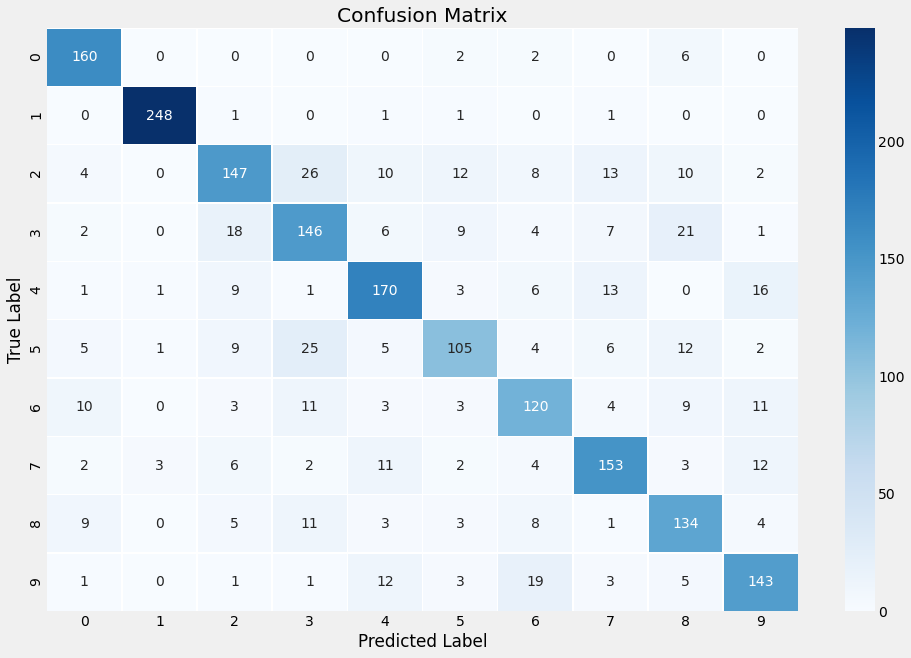

In [33]:
from sklearn.metrics import confusion_matrix
import seaborn as sn
import pandas as pd
import matplotlib.pyplot as plt

cfsn_matrix = confusion_matrix(y_test, y_pred)
df = pd.DataFrame(cfsn_matrix, index=range(10), columns=range(10))

plt.figure(figsize=(15, 10))
heatmap = sn.heatmap(df, annot=True, linewidths=0.5, fmt='d', cmap="Blues")

heatmap.set_xlabel("Predicted Label")
heatmap.set_ylabel("True Label")
heatmap.set_title("Confusion Matrix")
plt.show()
